# Визуализация бинарной разметки (GT)\n50 случайных изображений из train + val + test с наложением бинарных масок.

In [1]:
import random
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image, ImageDraw

DATA_ROOT = Path("/home/dsa/new_seg_final/single_dataset")
NUM_SAMPLES = 50
ALPHA = 0.45  # mask overlay transparency
MASK_COLOR = np.array([1.0, 0.0, 0.0])  # red

random.seed(42)

# Collect all (image, label) pairs across splits
samples = []
for split in ["train", "val", "test"]:
    img_dir = DATA_ROOT / split / "images"
    lbl_dir = DATA_ROOT / split / "labels_binary"
    if not img_dir.exists() or not lbl_dir.exists():
        continue
    for img_path in sorted(img_dir.glob("*.png")):
        lbl_path = lbl_dir / f"{img_path.stem}.txt"
        if lbl_path.exists() and lbl_path.stat().st_size > 0:
            samples.append((img_path, lbl_path, split))

random.shuffle(samples)
samples = samples[:NUM_SAMPLES]
print(f"Total pairs found: {len(samples)}")

Total pairs found: 50


In [2]:
def load_binary_mask(label_path, h, w):
    """Load binary GT mask from YOLO-format label (composite polygons with holes).
    
    Uses PIL even-odd fill so bridge-cut holes work correctly.
    """
    mask = Image.new("L", (w, h), 0)
    draw = ImageDraw.Draw(mask)
    with open(label_path) as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 7:
                continue
            coords = list(map(float, parts[1:]))
            polygon = []
            for i in range(0, len(coords) - 1, 2):
                polygon.append((coords[i] * w, coords[i + 1] * h))
            if len(polygon) < 3:
                continue
            draw.polygon(polygon, fill=255)
    return np.array(mask, dtype=np.uint8)


def overlay_mask(img_np, mask, color=MASK_COLOR, alpha=ALPHA):
    """Overlay binary mask on image with transparency."""
    out = img_np.copy().astype(np.float32) / 255.0
    m = (mask > 0)
    for c in range(3):
        out[:, :, c] = np.where(m, out[:, :, c] * (1 - alpha) + color[c] * alpha, out[:, :, c])
    return (out * 255).astype(np.uint8)

print("Helpers OK")

Helpers OK


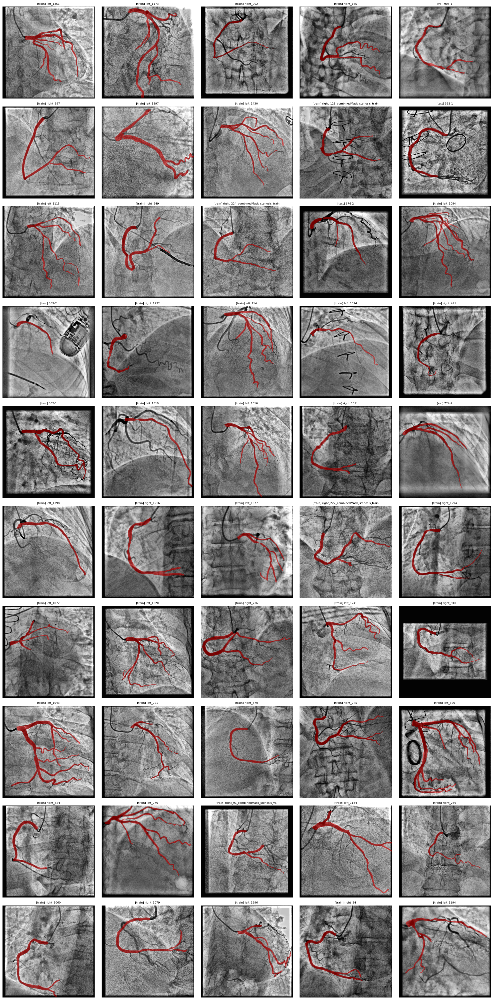

Done!


In [3]:
COLS = 5
ROWS = 10
fig, axes = plt.subplots(ROWS, COLS, figsize=(COLS * 4, ROWS * 4))
axes = axes.flatten()

for idx, (img_path, lbl_path, split) in enumerate(samples):
    img = Image.open(img_path).convert("RGB")
    img_np = np.array(img)
    h, w = img_np.shape[:2]
    
    mask = load_binary_mask(lbl_path, h, w)
    vis = overlay_mask(img_np, mask)
    
    axes[idx].imshow(vis)
    axes[idx].set_title(f"[{split}] {img_path.stem}", fontsize=8)
    axes[idx].axis("off")

# Hide unused axes
for idx in range(len(samples), len(axes)):
    axes[idx].axis("off")

plt.tight_layout()
plt.show()
print("Done!")